# 实验五：卷积神经网络


在本实验中，你将学习到：

1. PyTorch深度学习库的基本用法
2. 如何在PyTorch中建立和使用神经网络模型
3. 如何通过网络反向传播梯度
4. 如何生成对抗性样本

如果这是你第一次使用PyTorch，请首先***阅读[PyTorch深度学习：60分钟速成]教程( http://pytorch.org/tutorials/beginner/deep_learning_60min_blitz.html )。 *** 这不会花太长时间，但是你将学到很多东西，并使这次实验变得容易得多！ 


# 安装实验环境

请使用pip安装本实验需要的python包：PyTorch、OpenCV for python、numpy、matplotlib、scipy、protobuf。

## 初始化

运行下面的Cell以初始化本实验需要的函数。

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.autograd import Variable

import urllib
import cv2
import numpy as np
import os, sys,  math, random, subprocess
import matplotlib.pyplot as plt
from scipy.ndimage.filters import gaussian_filter
from IPython.display import clear_output, Image, display, HTML
from google.protobuf import text_format
from io import StringIO
import PIL.Image

# Configure matplotlib to render inline
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)        # large images
plt.rcParams['image.interpolation'] = 'nearest'  # don't interpolate: show square pixels
plt.rcParams['image.cmap'] = 'gray'  # use grayscale output rather than a (potentially misleading) color heatmap

    
def get_n_params(module):
  nparam = 0
  for name, param in module.named_parameters():
    param_count = 1
    for size in list(param.size()):
      param_count *= size
    nparam += param_count
  return nparam

def get_model_params(model):
  nparam = 0
  for name, module in model.named_modules():
    nparam += get_n_params(module)
  return nparam

def np_img_from_url(url):
  url_response = urllib.urlopen(url)
  img_array = np.array(bytearray(url_response.read()), dtype=np.uint8)
  img = cv2.imdecode(img_array, -1)
  return img

def to_numpy_image(tensor_or_variable):
  
  # If this is already a numpy image, just return it
  if type(tensor_or_variable) == np.ndarray:
    return tensor_or_variable
  
  # Make sure this is a tensor and not a variable
  if type(tensor_or_variable) == Variable:
    tensor = tensor_or_variable.data
  else:
    tensor = tensor_or_variable
  
  # Convert to numpy and move to CPU if necessary
  np_img = tensor.detach().cpu().numpy()
  
  # If there is no batch dimension, add one
  if len(np_img.shape) == 3:
    np_img = np_img[np.newaxis, ...]
  
  # Convert from BxCxHxW (PyTorch convention) to BxHxWxC (OpenCV/numpy convention)
  np_img = np_img.transpose(0, 2, 3, 1)
  
  return np_img


def to_pytorch_image(np_image):
  
  # Create a batch dimension
  if len(np_image.shape) == 3:
    np_image = np_image[np.newaxis, ...]
  
  # Convert from BxHxWxC (OpenCV/numpy) to BxCxHxW (PyTorch)
  np_image = np_image.transpose(0, 3, 1, 2)
  
  pytorch_img = torch.from_numpy(np_image).float()
  
  return pytorch_img
  
def draw_border(image_np, color):
  color = np.asarray(color)
  s = image_np.shape
  image_np = image_np.copy()
  image_np[0:5, :, :] = color[np.newaxis, np.newaxis, :]
  image_np[:, 0:5, :] = color[np.newaxis, np.newaxis, :]
  image_np[s[0]-5:s[0], :, :] = color[np.newaxis, np.newaxis, :]
  image_np[:, s[0]-5:s[0], :] = color[np.newaxis, np.newaxis, :]
  return image_np

def normalize_zero_one_range(tensor_like):
  x = tensor_like - tensor_like.min()
  x = x / (x.max() + 1e-9)
  return x


def prep_for_showing(image):
  np_img = to_numpy_image(image)
  if len(np_img.shape) > 3:
    np_img = np_img[0]
  np_img = normalize_zero_one_range(np_img)
  return np_img

  
def show_image(tensor_var_or_np, title=None, bordercolor=None):
  np_img = prep_for_showing(tensor_var_or_np)
  
  if bordercolor is not None:
    np_img = draw_border(np_img, bordercolor)
  
  # plot it
  np_img = np_img.squeeze()
  plt.figure(figsize=(4,4))
  plt.imshow(np_img)
  plt.axis('off')
  if title: plt.title(title)
  plt.show()
    
def show_images(images, correct_list=None, size=128, titles=None):
  for i, image in enumerate(images):
    bordercolor = ([0,1,0] if correct_list[i] else [1,0,0]) if correct_list else None
    show_image(image, bordercolor=bordercolor, title=titles[i] if titles else None)
    
def show_image_rows(image_lists):
  for l in image_lists:
    #plt.figure(figsize=(1, len(l)))
    #plt.axis('off')
    f, axarr = plt.subplots(1,len(l))
    #print(axarr)
    for i,img in enumerate(l):
      img_np = prep_for_showing(img).squeeze()
      axarr[i].imshow(img_np)
      axarr[i].axis('off')
    plt.show()

def filename_to_image(filename):
	#read the image, convert it to a NumPy array, and then read
	# it into OpenCV format
  image = np.memmap(filename, dtype=np.uint8,mode="r")
  image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    # Convert BGR to RGB
  image = image[:, :, [2,1,0]]
  
  return image

def filename_to_text(filename):
  file=open(filename)
  text = file.read()
  return text


## 数据集

以下Cell实现了一个数据集Dataset，该数据集加载了稍后将在本实验中使用的图像。

它是`torch.utils.data.Dataset`的子类。`Dataset`是pytorch中“数据集”的基类，可以与`torch.utils.data.Dataloader`一起使用。Dataloader类可以让我们轻松在多个后台线程中加载数据，而无需编写任何线程代码。这很重要，因为神经网络训练中最大的瓶颈之一就是将数据输入模型的速度。

Dataset类实现了`__len__`和`__getitem__`方法，这意味着可以通过对数据集进行索引来获取样本，例如`sample = dataset[5]`。

当使用PyTorch进行计算机视觉相关的工作时，`torchvision`是非常有用的程序包，它提供了最流行的一些计算机视觉数据集(http://pytorch.org/docs/master/torchvision/datasets.html )。在本实验中，我们自己来滚动数据集加载图像。


In [3]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import glob

IMAGENET_MEAN = torch.FloatTensor([0.485, 0.456, 0.406])
IMAGENET_STD = torch.FloatTensor([0.229, 0.224, 0.225])

class FoodAndDogDataset(Dataset):
  """
  PyTorch DataLoader compatible dataset that pre-loads images from the dataset. 
  Images are returned as tensors, normalized with the imagenet normalization.
  """
  def __init__(self, include_classes="both"):
    self.dog_paths = glob.glob(os.getcwd()+r'/dataset/test-dog/*.jpg')
    self.food_paths = glob.glob(os.getcwd()+r'/dataset/test-food/*.jpg')
    self.dog_labels = [0 for _ in self.dog_paths]
    self.food_labels = [1 for _ in self.food_paths]
    
    self.img_paths = []
    self.img_labels = []
    
    if include_classes in ["both", "dogs"]:
      self.img_paths += self.dog_paths
      self.img_labels += self.dog_labels
    
    if include_classes in ["both", "food"]:
      self.img_paths += self.food_paths
      self.img_labels += self.food_labels
  
    # We might not want to do this on a real dataset, if we have a lot of data.
    # In that case we would lazy-download images.
    # But for now we will pre-download them, because there's not that many
    self.all_images_np = [filename_to_image(filename).astype(np.float32) / 255 for filename in self.img_paths]
  
    print(f"Initialized dataset: {include_classes} with {len(self.all_images_np)} images")
  
  def __len__(self):
    return len(self.img_paths)
  
  def __getitem__(self, idx):
    img_i_np = self.all_images_np[idx]
    label_i = self.img_labels[idx]

    # Convert to pytorch. Copy so that we don't keep re-normalizing the same image multiple times.
    img_i_tensor = to_pytorch_image(img_i_np.copy())

    # Pre-process the image:
    # Normalize using the mean and variance of the ImageNet dataset
    # The model was trained from this dataset
    img_i_tensor = img_i_tensor - IMAGENET_MEAN[np.newaxis, :, np.newaxis, np.newaxis].expand_as(img_i_tensor)
    img_i_tensor = img_i_tensor / IMAGENET_STD[np.newaxis, :, np.newaxis, np.newaxis].expand_as(img_i_tensor)

    assert img_i_tensor.size(2) == img_i_tensor.size(3) == 256, "Images expected to be of shape 1x3x256x256"
    
    # Take a center-crop of image, assuming the image is 256x256
    img_i_tensor = img_i_tensor[:, :, 16:240, 16:240]
    
    return img_i_tensor[0], label_i
    
dog_dataset = FoodAndDogDataset(include_classes="dogs")
food_dataset = FoodAndDogDataset(include_classes="food")
full_dataset = FoodAndDogDataset(include_classes="both")



Initialized dataset: dogs with 33 images
Initialized dataset: food with 25 images
Initialized dataset: both with 58 images


## ImageNet (ILSVRC2012) 类标签

本实验将使用在ILSVRC2012数据集上预训练过的AlexNet模型。为了理解模型的输出，我们需要知道从输出概率到类名称之间的映射关系。以下Cell中的代码将加载此映射文件。

In [4]:
imagenet_id_to_label = {}
labels_file = filename_to_text(os.getcwd()+r'/dataset/imagenet_classes.txt')
labels_id2word = labels_file.split("\n")[:1000]
print(labels_id2word)


['tench, Tinca tinca', 'goldfish, Carassius auratus', 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 'tiger shark, Galeocerdo cuvieri', 'hammerhead, hammerhead shark', 'electric ray, crampfish, numbfish, torpedo', 'stingray', 'cock', 'hen', 'ostrich, Struthio camelus', 'brambling, Fringilla montifringilla', 'goldfinch, Carduelis carduelis', 'house finch, linnet, Carpodacus mexicanus', 'junco, snowbird', 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 'robin, American robin, Turdus migratorius', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel, dipper', 'kite', 'bald eagle, American eagle, Haliaeetus leucocephalus', 'vulture', 'great grey owl, great gray owl, Strix nebulosa', 'European fire salamander, Salamandra salamandra', 'common newt, Triturus vulgaris', 'eft', 'spotted salamander, Ambystoma maculatum', 'axolotl, mud puppy, Ambystoma mexicanum', 'bullfrog, Rana catesbeiana', 'tree frog, tree-frog', 'tailed frog, bell toad, 

## 关于PyTorch

PyTorch在Tensor上实现了许多操作（例如torch.FloatTensor或torch.LongTensor），其方式与numpy在ndarray上实现操作的方式大致相同。Variables（torch.autograd.Variable）包装了Tensor，两者可以互换使用。在Tensor上执行操作时，输出为新的Tensor。而对Variable执行操作时，输出也是Variable。

所有涉及Variables的操作都会自动生成一个计算图（前提是该操作涉及的Variables都将`require_grad`参数设置为True）。这意味着在任何时候，对任何Variable调用`backward`方法都会计算出该Variable相对于所有其他Variables的梯度。因此，在损失函数上调用`backward`方法将计算出模型中所有参数的梯度，从而能够实现梯度下降。

如果输入变量上的`requires_grad`属性设置为true，我们也可以使用`backward`来计算输入变量的梯度。调用`backward`方法后，可以访问Variable的`.grad`属性来获得梯度。下面是使用此方法来获得输入变量的梯度的典型代码：

给定类型为torch.FloatTensor的输入变量和目标变量，首先，我们必须将所有Variables的梯度置为0。在nn.Module上，这会将所有模型参数的梯度归零。

```
  some_model.zero_grad()
```
将输入变量和目标变量转换为需要梯度的Variable  
```
  input_var = Variable(input, requires_grad=True)
  target_var = Variable(target)
```
  
调用模型并计算损失函数
```
  out = some_model(input_var)
  loss = some_loss_function(out, target)
```

反向传播
```
  loss.backward()
```

访问损失函数相对于输入变量的梯度
```
  grad_input = input_var.grad
  
  grad_input_tensor = grad_input.data
  
  grad_input_numpy = grad_input_tensor.cpu().numpy()
  
```
给定Variable，可以访问`data`属性来获得内嵌的Tensor。

PyTorch在`torch.nn`包中实现了许多神经网络操作。这些通常打包在一个`Module`中，从而可以方便地对神经网络结构进行模块化设计。


## AlexNet的定义

以下是实现AlexNet的`Module`。代码是从`torchvision`包复制而来的，并进行了细微的修改以便于在本实验中使用。具体来说，由于原始实现使用了nn.Sequential容器，因此无法直接访问各个层。我们通过定义`shortcut_modules`属性以使它们可以直接访问。


In [5]:
import torch.nn as nn
import torch.utils.model_zoo as model_zoo


model_urls = {
    'alexnet': 'https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth',
}

INPLACE = False

class AlexNet(nn.Module):

    def __init__(self, num_classes=1000):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=INPLACE),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=INPLACE),
            nn.Linear(4096, num_classes),
        )
        
        self.module_shortcuts = {
            "conv1": self.features[0],
            "relu1": self.features[1],
            "conv2": self.features[3],
            "relu2": self.features[4],
            "conv3": self.features[6],
            "relu3": self.features[7],
            "conv4": self.features[8],
            "relu4": self.features[9],
            "conv5": self.features[10],
            "relu5": self.features[11],
            
            "fc6": self.classifier[2],
            "fc7": self.classifier[5],
            "fc8": self.classifier[6]
        }
    
        
    def __getitem__(self, layer_name):
      if layer_name in self.module_shortcuts:
        return self.module_shortcuts[layer_name]
      return None
    
    
    def shortcut_modules(self):
      for name, mod in self.module_shortcuts.items():
        yield name, mod
    
    
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), 256 * 6 * 6)
        x = self.classifier(x)
        return x


def alexnet(pretrained=False, **kwargs):
    r"""AlexNet model architecture from the
    `"One weird trick..." <https://arxiv.org/abs/1404.5997>`_ paper.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = AlexNet(**kwargs)
    if pretrained:
        print("Loading pre-trained weights from model zoo")
        model.load_state_dict(model_zoo.load_url(model_urls['alexnet']))
    model.eval()
    return model

model = alexnet(pretrained=True, num_classes=1000)

Loading pre-trained weights from model zoo


# 所有TODO的解答

<font color='red' size='3em'>所有需要你完成的解答和代码都写在本部分</font>

** TODO 1 的答案**:
fc6和fc7均为激活函数ReLU，而ReLU将所有负值置为0，故而输出均为正值不包含负值；而fc8为线性变换，既产生正值也产生负值。



In [13]:
def convert_ilsvrc2012_probs_to_dog_vs_food_probs(probs_ilsvrc):
    """
    Convert from 1000-class ILSVRC probabilities to 2-class "dog vs food"
    incices.  Use the variables "dog_indices" and "food_indices" to map from
    ILSVRC2012 classes to our classes.
    HINT:
    Compute "probs" by first estimating the probability of classes 0 and 1,
    using probs_ilsvrc.  Stack together the two probabilities along axis 1, and
    then normalize (along axis 1).
    :param probs_ilsvrc: shape (N, 1000) probabilities across 1000 ILSVRC classes
    :return probs: shape (N, 2): probabilities of each of the N items as being
        either dog (class 0) or food (class 1).
    """
    # in the ILSVRC2012 dataset, indices 151-268 are dogs and index 924-969 are foods
    dog_indices = range(151, 269)
    food_indices = range(924, 970)
    N, _ = probs_ilsvrc.shape
    probs = np.zeros((N, 2)) # placeholder
    sum_probs=np.zeros((N,1))
    ############################ TODO 2 BEGIN #################################
    for i in range(N):
        probs[i,0] = np.sum(np.array([probs_ilsvrc[i,j] for j in dog_indices])) 
        probs[i,1] = np.sum(np.array([probs_ilsvrc[i,j] for j in food_indices])) 
        sum_probs[i,0] = np.sum(probs[i,:])
        probs[i,:] /=sum_probs[i,0]
    ############################ TODO 2 END #################################
    return probs

In [16]:
def get_prediction_descending_order_indices(probs, cidx):
    """
    Returns the ordering of probs that would sort it in descending order
    :param probs: (N, 2) probabilities (computed in TODO 2)
    :param cidx: class index (0 or 1)
    :return list of N indices that sorts the array in descending order
    """
    order = range(probs.shape[0]) # placeholder
    ############################ TODO 3 BEGIN #################################
    order = np.argsort(-probs[:,cidx])
    ############################ TODO 3 END #################################
    return order

In [20]:
def compute_dscore_dimage(scores, image, class_idx):
    """
    Returns the gradient of s_y (the score at index class_idx) with respect to
    the image (data), ds_y / dI.  Note that this is the unnormalized class
    score "s", not the probability "p".
    :param scores: (Variable) shape (1000) the output scores from AlexNet for image
    :param image: (Variable) shape (1, 3, 224, 244) the input image
    :param class_idx: class index in range [0, 999] indicating which class to compute saliency for
    :return grad: (Tensor) shape (3, 224, 224), gradient ds_y / dI
    """
    grad = torch.zeros_like(image) # placeholder
    ############################ TODO 4 BEGIN #################################
    scores[class_idx].backward()
    grad = image.grad
    ############################ TODO 4 END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad[0]

In [37]:
def normalized_sgd_with_momentum_update(image, grad, velocity, momentum, learning_rate):
    """
    :param image: (Variable) shape (1, 3, 224, 244) the current solution
    :param grad: (Variable) gradient of the loss with respect to the image
    :param velocity: (Variable) momentum vector "V"
    :param momentum: (float) momentum parameter "mu"
    :param learning_rate: (float) learning rate "alpha"
    :return: (Variable) the updated image and momentum vector (image, velocity)
    """
    ############################ TODO 5a BEGIN #################################
    velocity = momentum*velocity - learning_rate*(grad/torch.norm(grad))
    image = image + velocity
    ############################ TODO 5a END #################################
    return image, velocity

In [58]:
def fooling_image_gradient(target_score, orig_data, image_in, target_class, reg_lambda):
    """
    Compute the gradient for make_fooling_image (dL / dI).
    :param target_score: (Variable) holding the current score assigned to the target class
    :param orig_data: (Variable) shape (1, 3, 224, 224) holding the original image
    :param image_in: (Variable) shape (1, 3, 224, 224) hoding the current solution
    :param target_class: (int) ILSVRC class in range [0, 999]
    :param reg_lambda: (float) weight applied to the regularizer.
    :return grad: (Variable) gradient dL / dI
    """
    grad = torch.zeros_like(image_in) # placeholder
    ############################ TODO 5b BEGIN #################################
    
    R = 0.5*reg_lambda*torch.norm((image_in-orig_data))**2
    L = -target_score + R
    L.backward()
    grad = image_in.grad
    ############################ TODO 5b END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad

In [27]:
torch.norm?

In [61]:
def class_visualization_gradient(target_score, image, target_class, reg_lambda):
    """
    Compute the gradient for make_class_visualization (dL / dI).
    :param target_score: (Variable) holding the current score assigned to the target class
    :param image: (Variable) shape (1, 3, 224, 224) the current solution
    :param target_class: (int) ILSVRC class in range [0, 999]
    :param regularization: (float) weight (lambda) applied to the regularizer.
    :return grad: (Variable) gradient dL / dI
    """
    grad = torch.zeros_like(image) # placeholder

    ############################ TODO 6 BEGIN #################################
    R = 0.5*reg_lambda*torch.norm(image)**2
    L = -target_score + R
    L.backward()
    grad = image.grad
    ############################ TODO 6 END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad

# 1. AlexNet: 可视化结构

AlexNet由5个卷积层和3个全连接层组成。这些层都封装在具有多个可训练参数的nn.Module类中。

我们可以运行下面的Cell查看所有模型参数的形状：


In [5]:
model_num_params = 0

# Loop through all modules
model_num_params = get_n_params(model)
print(f"# params in AlexNet: {model_num_params}")

# Loop through the select modules that we've named:
for simple_name, module in model.shortcut_modules():
  if hasattr(module, "weight"):
    print(f"Module {simple_name} weights: {module.weight.size()} bias: {module.bias.size()}")

# params in AlexNet: 61100840
Module conv1 weights: torch.Size([64, 3, 11, 11]) bias: torch.Size([64])
Module conv2 weights: torch.Size([192, 64, 5, 5]) bias: torch.Size([192])
Module conv3 weights: torch.Size([384, 192, 3, 3]) bias: torch.Size([384])
Module conv4 weights: torch.Size([256, 384, 3, 3]) bias: torch.Size([256])
Module conv5 weights: torch.Size([256, 256, 3, 3]) bias: torch.Size([256])
Module fc8 weights: torch.Size([1000, 4096]) bias: torch.Size([1000])


### 可视化conv1滤波器

conv1中的滤波器是独特的，因为它们的输入是RGB图像。这意味着我们可以将它们可视化为RGB图像。对于所有其他层，我们不能将它们可视化为漂亮的彩色正方形，因为它们的维度更高。


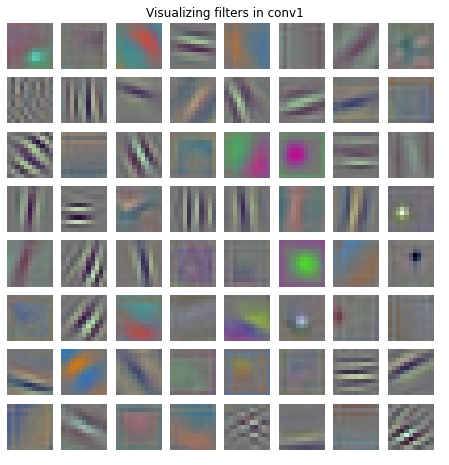

In [6]:
def vis_square(data, title=None):
    """Take a Tensor of shape (n, K, height, width) 
       and visualize each (height, width) thing in a grid of size approx. sqrt(n) by sqrt(n)"""
    
    if data.size(1) > 3:
      data = data.view(-1, 1, data.size(2), data.size(3))
    
  
    data = to_numpy_image(data)
        
    # normalize data for display
    data = (data - data.min()) / (data.max() - data.min())
    
    # force the number of filters to be square
    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = (((0, n ** 2 - data.shape[0]),
               (0, 2), (0, 2))                 # add some space between filters
               + ((0, 0),) * (data.ndim - 3))  # don't pad the last dimension (if there is one)
    data = np.pad(data, padding, mode='constant', constant_values=1)  # pad with ones (white)
    
    # tile the filters into an image
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3) + tuple(range(4, data.ndim + 1)))
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    
    data = data.squeeze()
    
    # plot it
    plt.figure(figsize=(8, 8))
    plt.imshow(data)
    plt.axis('off')
    if title: plt.title(title)
        

weights = model.features[0].weight.data
vis_square(weights, title="Visualizing filters in conv1")


## 可视化AlexNet激活函数

PyTorch使用动态计算图。结果是我们没有办法直接访问中间激活函数。唯一的方法是使用钩子访问中间激活函数。前向传递钩子是每次在模块上执行forward方法时都会调用的函数。因此，为了访问中间激活函数，我们注册了一个显示激活函数的前向传递钩子。

让我们以示例图像为例，并将其输入AlexNet，直到输出层。

使用下面的代码可以可视化所有这些层中的激活函数。较亮的值具有较高的幅度，而较暗的值具有较小的幅度。


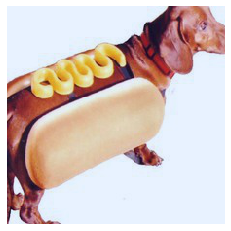

In [7]:
# Load the image of the dog
example_image, label = dog_dataset[10]
show_image(example_image)

Loading pre-trained weights from model zoo
Visualizing layer: conv1,data size:torch.Size([1, 64, 55, 55])
Visualizing layer: relu1,data size:torch.Size([1, 64, 55, 55])
Visualizing layer: conv2,data size:torch.Size([1, 192, 27, 27])
Visualizing layer: relu2,data size:torch.Size([1, 192, 27, 27])
Visualizing layer: conv3,data size:torch.Size([1, 384, 13, 13])
Visualizing layer: relu3,data size:torch.Size([1, 384, 13, 13])
Visualizing layer: conv4,data size:torch.Size([1, 256, 13, 13])
Visualizing layer: relu4,data size:torch.Size([1, 256, 13, 13])
Visualizing layer: conv5,data size:torch.Size([1, 256, 13, 13])
Visualizing layer: relu5,data size:torch.Size([1, 256, 13, 13])
Visualizing layer: fc6,data size:torch.Size([1, 4096])
Visualizing layer: fc7,data size:torch.Size([1, 4096])
Visualizing layer: fc8,data size:torch.Size([1, 1000])


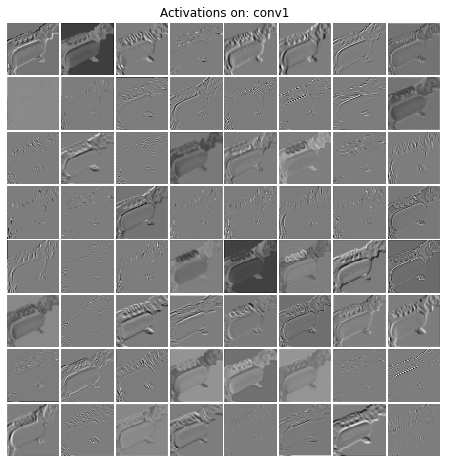

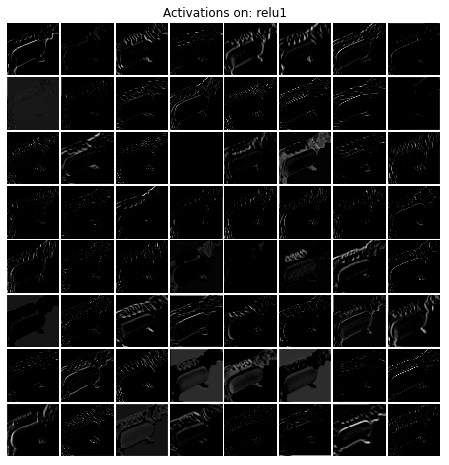

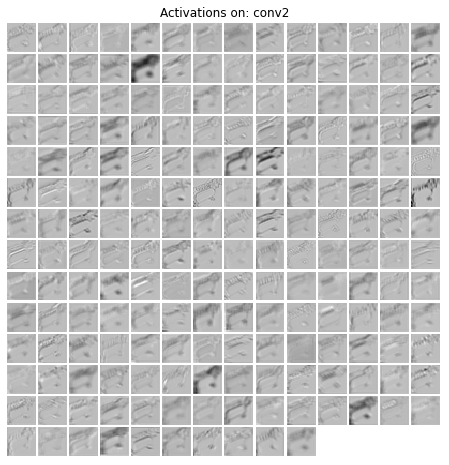

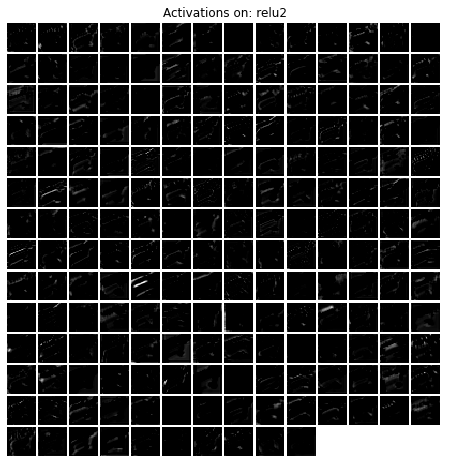

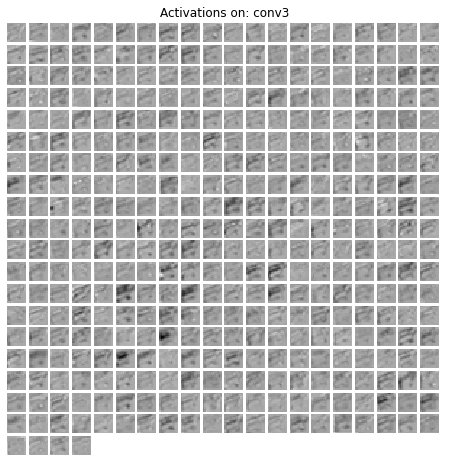

...

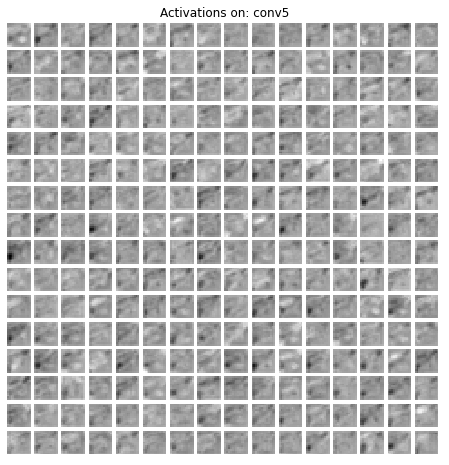

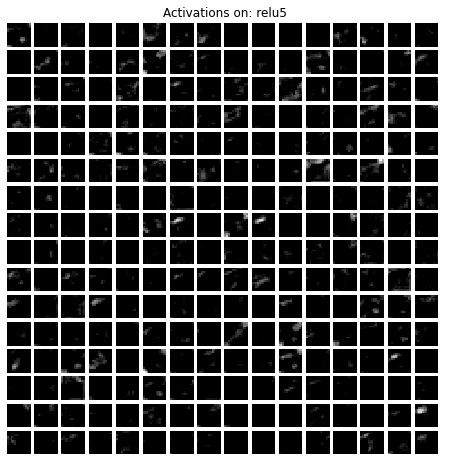

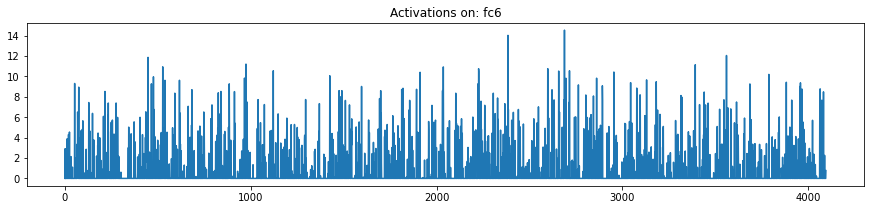

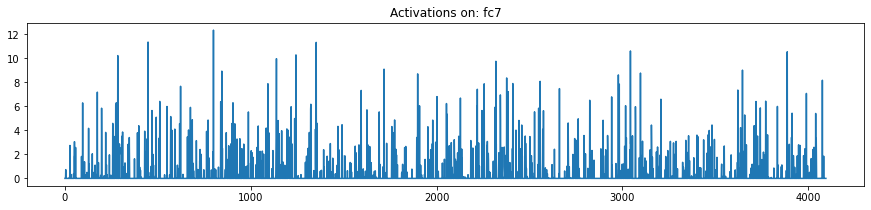

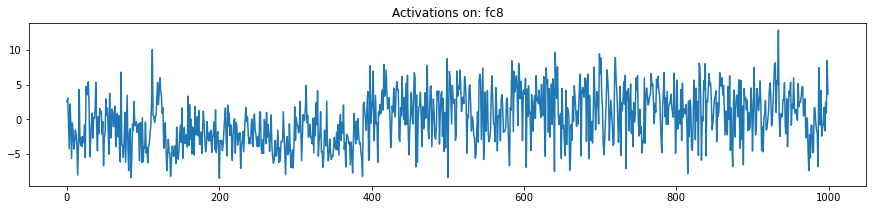

In [8]:
import functools

# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)

# Define a hook that visualizes a layer output
def show_activations_hook(name, module, input, output):
  
  print(f"Visualizing layer: {name},data size:{output.size()}")
  # For conv/relu layer outputs (BxCxHxW) we plot an image as before
  if output.dim() == 4:
    vis_square(output, f"Activations on: {name}")
  
  # For linear layer outputs, we plot the activations as a line plot
  else:
    feat = output.data.view([-1]).cpu().numpy()
    plt.figure(figsize=(15, 3))
    plt.plot(feat)
    plt.title(f"Activations on: {name}")
  
# Register the hook on the select set of modules
for name, module in model.shortcut_modules():
  hook = functools.partial(show_activations_hook, name)
  module.register_forward_hook(hook)
  
# PyTorch modules work on minibatches and expect the first axis to be the batch axis
# If we run a model on a single image, we must turn this into a batch of size 1
model_input = Variable(example_image[np.newaxis, ...])

# Run the forward pass on the model
class_activations = model(model_input)[0]

### ?? 问题1 ??

考虑以上Cell产生的可视化效果，为什么`fc8`具有负值，而`fc6`和`fc7`只具有正值？

提示：查看上面的AlexNet网络结构，特别是在`AlexNet.module_shortcuts`中选择的命名层，注意`fc6`、`fc7`、`fc8`都是哪些层的输出。


### **<font color='red' size='3em'>TODO 1: 在上面"所有TODO的解答"cell中写出你的答案</font>**

## 获得分类的结果

上面的AlexNet模型输出类“分数”。我们使用softmax激活函数将这些分数转换为1000个ImageNet类的有效概率分布，然后我们找到分数最高的类索引，并将其映射到类名称，从而获得了分类结果。


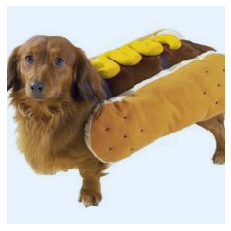

Loading pre-trained weights from model zoo
Predicted class: 207 - golden retriever with probability 0.5218547582626343


In [9]:
# Load the image of the hot dog
example_image, label = dog_dataset[4]
show_image(example_image)

# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)

# Set to eval mode to disable dropout
model.eval()

model_input = example_image[np.newaxis, ...]

model_input = model_input.clone()

# Run the forward pass on the model
class_activations = model(Variable(model_input))[0]

# Compute class probabilities
class_probs = F.softmax(class_activations, dim=0)

# Get the class index
prob, class_idx = torch.max(class_probs, 0)

# Take the integer index out of the variable and tensor
class_idx = class_idx.data.item()

predicted_class_name = labels_id2word[class_idx]
print(f"Predicted class: {class_idx} - {predicted_class_name} with probability {prob.data.item()}")

**分类结果对吗？**

我们可以看到，尽管这只狗穿着误导性的服装，但该示例已被正确分类并具有较高的置信度！


# 2. Dog vs Food: 二分类

我们来对狗与食物进行二分类。我们准备了一套测试集，其中包括装扮成热狗的狗的图片，以及切成动物样子的热狗图片。

以下Cell可视化了我们数据集中的图像：

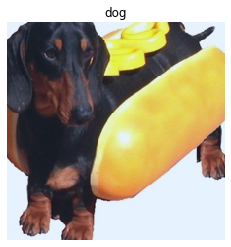

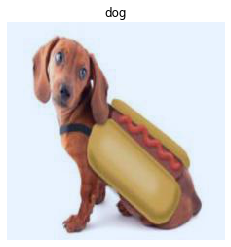

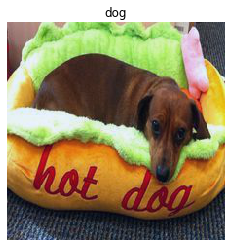

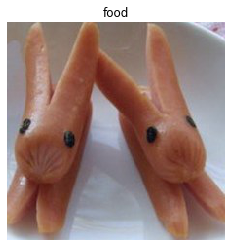

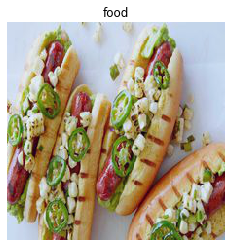

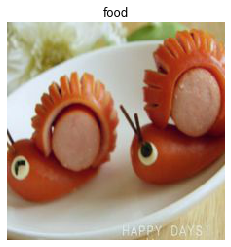

In [7]:
classes = ['dog', 'food']
class_datasets = [dog_dataset, food_dataset]

for cidx, cname in enumerate(classes):
  for i, (image, label) in enumerate(class_datasets[cidx]):
    if i >= 3:
      break
    show_image(image, classes[label])

### 利用ILSVRC2012分类器实现二分类

经过预训练的AlexNet可以分类1000类图像。我们可以通过重新映射类别，将其用于“狗与食物”二分类任务。


### **<font color="red">TODO 2: 实现 `convert_ilsvrc2012_probs_to_dog_vs_food_probs`函数，将其写于上面“所有TODO的解答”Cell中</font>**
提示：基本思路为对于某张图片，将其属于狗的类别概率求和，再把其属于食物的类别概率求和，最后归一化得到狗与食物两类的概率。你会发现`np.sum()`函数很有用。

In [14]:
# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)
N = len(full_dataset)

dataloader = DataLoader(
    full_dataset,
    batch_size=1024,
    shuffle=False,
    num_workers=0,
    pin_memory=False,
    drop_last=False)

assert len(dataloader) == 1, "Since batch_size is bigger than the number of examples, we should only have one batch"

for batch in dataloader:
  images = batch[0]
  labels = batch[1]
  labels_np = labels.numpy()
  
  class_activations = model(Variable(images))
  ilsvrc_class_probs = F.softmax(class_activations, dim=1)
  
  # Convert from Variable containing FloatTensor to numpy ndarray
  ilsvrc_class_probs_np = ilsvrc_class_probs.data.cpu().numpy()

  dogfood_class_probs_np = convert_ilsvrc2012_probs_to_dog_vs_food_probs(ilsvrc_class_probs_np)

  assert list(dogfood_class_probs_np.shape) == [N, 2]
  
  np.testing.assert_almost_equal(np.sum(dogfood_class_probs_np, axis=1), np.ones(N), decimal=5)
  
  print("Seems correct!")


Loading pre-trained weights from model zoo
Seems correct!


#评估分类准确度

狗的分类准确度应该约为90％，食物的分类准确度约为96％，总的准确度为93％。


In [15]:
predicted_class = np.argmax(dogfood_class_probs_np, axis=1)
correct_mask = predicted_class == labels_np
num_correct = np.sum(correct_mask)
accuracy = 100.0 * float(num_correct) / N

print(f"Overall accuracy {accuracy} {num_correct} / {N}")

for cidx, cname in enumerate(classes):
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  num_correct = np.sum(predicted_cls == cidx)
  cls_acc = 100.0 * float(num_correct) / cls_mask.sum()

  print(f"{cname} class accuracy {cls_acc} {num_correct} / {cls_mask.sum()}")

Overall accuracy 93.10344827586206 54 / 58
dog class accuracy 90.9090909090909 30 / 33
food class accuracy 96.0 24 / 25


# 3. Dog vs Food: 可视化

我们可以按“狗”分数和“食物”分数对预测结果进行排序，也即根据AlexNet认为图像属于该类别的概率对图像进行排序。

图像绿边框表示分类正确，红边框表示分类错误。分类不正确的图像应该在底部附近（得分最低）。 


### **<font color="red"> TODO 3: 实现 `get_prediction_descending_order_indices`函数，将其写于上面“所有TODO的解答”Cell中 </font>**
提示：你可能会发现`np.argsort()`函数很有用。

Predictions for class: dog


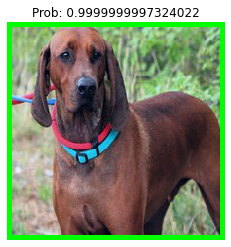

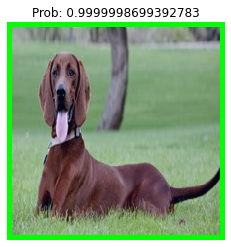

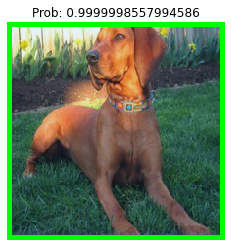

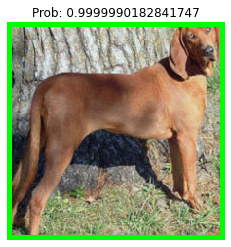

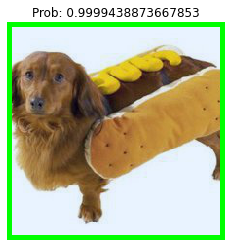

...

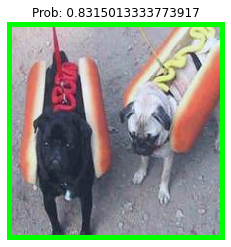

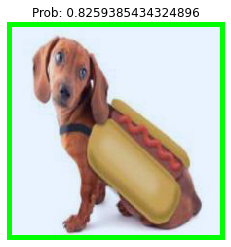

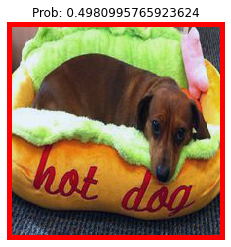

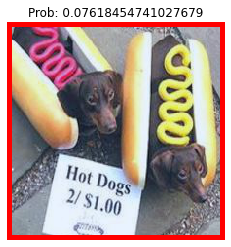

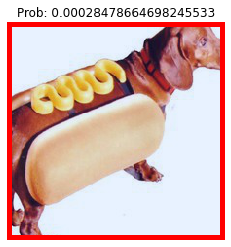

Predictions for class: food


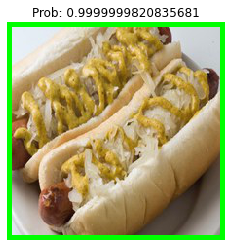

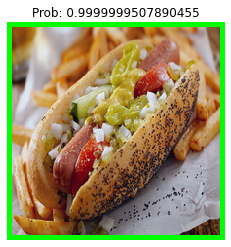

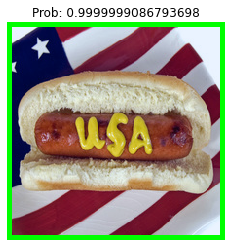

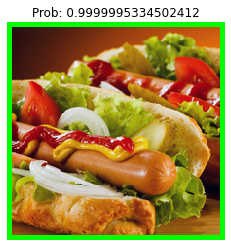

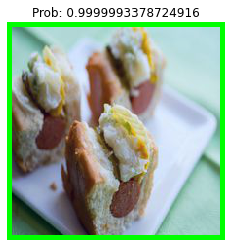

...

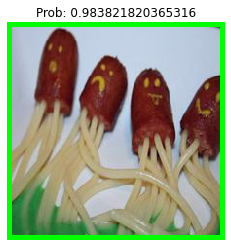

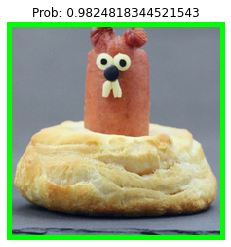

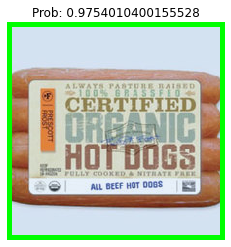

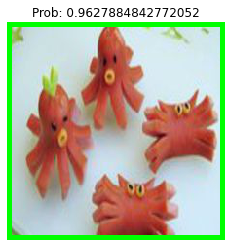

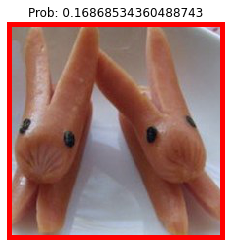

In [17]:
for cidx, cname in enumerate(classes):
  print(f"Predictions for class: {cname}")
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  cls_probs = dogfood_class_probs_np[cls_mask]
  correct = [p == cidx for p in predicted_cls]
  
  cls_images = [images[i] for i in range(len(images)) if cls_mask[i]]
  
  order = get_prediction_descending_order_indices(cls_probs, cidx)
  
  assert len(order) == cls_mask.sum()
  
  show_images(
    images = [cls_images[i] for i in order],
    correct_list = [correct[i] for i in order],
    titles = [f"Prob: {cls_probs[i, cidx]}" for i in order],
    size=128
  )

# 4. 显著性可视化

基于我们预训练过的AlexNet模型，我们可以按照参考文献[1] 3.1节中的方法来计算分类显著图。如[1]中第2节所述，我们应该针对未归一化的类别得分（fc8）而非归一化后的类别概率（prob）来计算梯度。你将要使用`backward`方法来计算梯度。

我们要计算：$${\partial s_y \over \partial I}$$

其中$s_y$是fc8层之后而在Softmax层之前的类别$y$的分数，$I$为输入图像。

然后，我们将该梯度值平方后，再取RGB三通道中的最大值，然后将其可视化，以评估输入图像对该类别的显著性分布。

[[1] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps", ICLR Workshop 2014.](http://arxiv.org/pdf/1312.6034.pdf)，见paper目录中的Classification Saliency.pdf文件。

### **<font color="red">TODO 4: 实现`compute_dscore_dimage`函数，将其写于上面“所有TODO的解答”Cell中</font>**
注意：你不需要在函数中调用model()，它已经运行了。下面所有要实现的梯度函数都是这样。。

提示：仔细阅读前面“关于PyTorch”Cell中的描述。

Loading pre-trained weights from model zoo
Saliency for class: dog


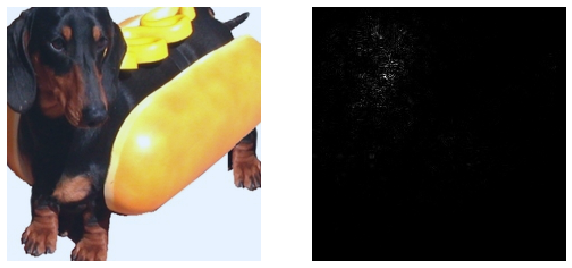

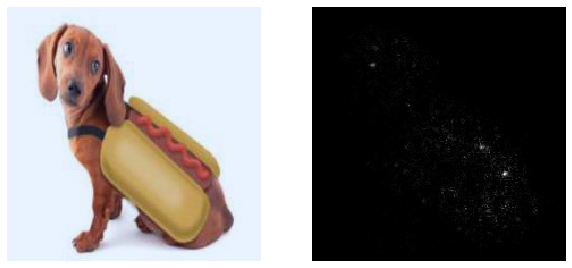

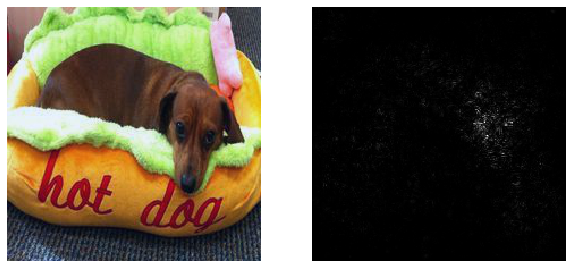

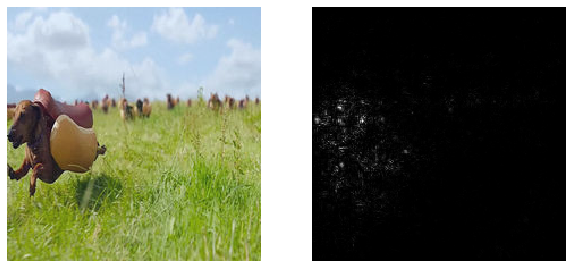

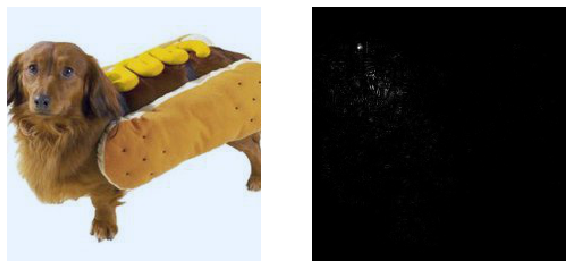

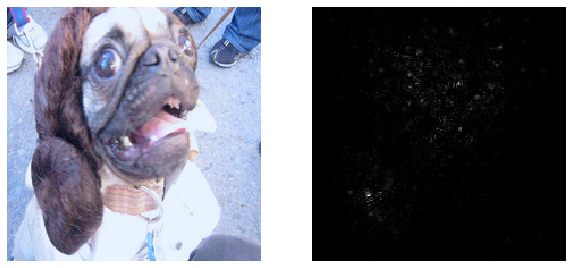

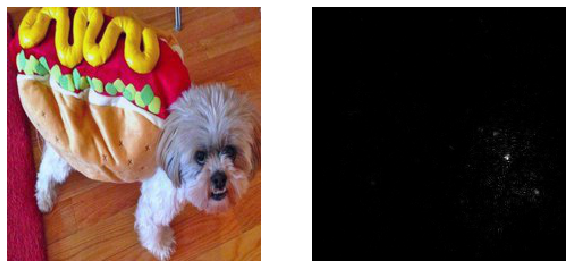

Saliency for class: food


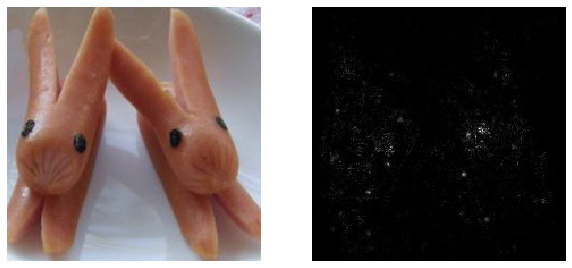

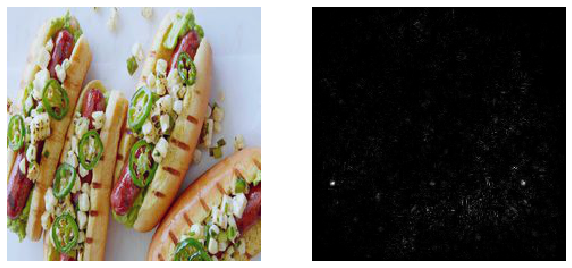

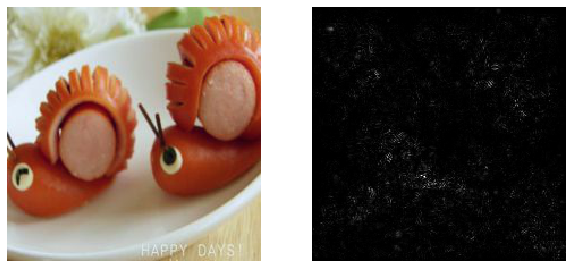

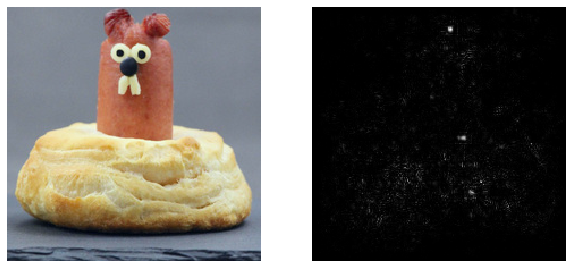

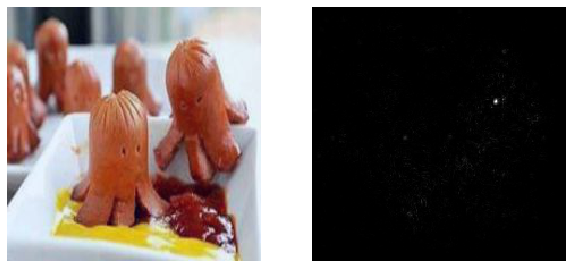

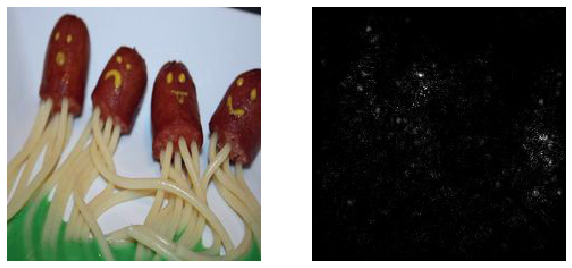

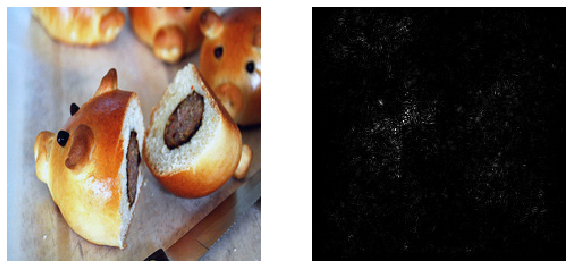

In [21]:
model = alexnet(pretrained=True)

def visualize_saliency(image):
    image_in = Variable(image.unsqueeze(0), requires_grad=True)
    cls_scores = model(image_in)[0]
    max_score, max_idx = torch.max(cls_scores, 0)
  
    grad = compute_dscore_dimage(cls_scores, image_in, max_idx)
    
    vis = grad * grad
    vis, _ = torch.max(vis, 0)
    
    return vis

class_datasets = [dog_dataset, food_dataset]
  
num_images = 6
for cidx, cname in enumerate(classes):
  
  print(f"Saliency for class: {cname}")
  in_images = []
  vis_images = []
  
  for i, sample in enumerate(class_datasets[cidx]):
    image_i = sample[0]
    label_i = sample[1]
  
    vis_image = visualize_saliency(image_i)
    
    assert list(vis_image.shape) == [224, 224]
    
    vis_images.append(vis_image.unsqueeze(0))
    in_images.append(image_i)
    if i >= num_images:
      break
  
  row_list = list(zip(in_images, vis_images))
  
  show_image_rows(row_list)
  
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  cls_probs = dogfood_class_probs_np[cls_mask]

# 5. 欺骗AlexNet

对于许多机器学习模型，可以通过稍微调整图像来“愚弄”它们，以使图像可以被预测为任何类别[2]。给定任何图像和任何目标类别，你可以执行梯度上升以最大程度地提高该目标类别的分数（等效于该类别的负分数的梯度下降），并在网络将其以高置信度预测为目标类别时停止。

同样，相对于未归一化的类别分数（fc8），而不是归一化后的类别概率（prob），来最大化分数。

除了最大化得分（最小化负得分）之外，在损失函数中增加了一个正则化项，用于计算原始图像和愚弄图像之间的L2范数。最终的梯度将是来自正则项的梯度和来自最大化类分数的梯度的总和。

我们可以将损失函数写成 $L$: $$
L = -s_y(I) + R(I)
$$

其中$$
R(I) = 0.5 \lambda \|I - I_\text{orig}\|_2^2
$$$y$是目标类别，$\lambda$是正则化系数。

**动量**

在使用卷积神经网络优化函数时，通常使用带动量的梯度下降，其更新规则为：$$V_t = \mu V_{t-1} - \alpha G$$$$I_t = I_{t-1} + V_{t}$$

其中$V$是速度，$\alpha$是学习率，$\mu$是动量参数，$t$是迭代次数，$G = \frac{\partial L}{\partial I_{t-1}}$是梯度。

为了提高稳定性，我们将使用稍微不同的更新公式，它将梯度$G$归一化为单位范数$$V_t = \mu V_{t-1} - \alpha \frac{G}{\|G\|}$$$$I_t = I_{t-1} + V_{t}$$

范数${\|G\|}$是将$G$中所有元素压平为向量后的2范数。

[[2] Szegedy et al, "Intriguing properties of neural networks", ICLR 2014](https://arxiv.org/pdf/1312.6199.pdf)，见paper目录中Intriguing.pdf文件。

### **<font color="red">TODO 5a: 实现上述更新规则，`normalized_sgd_with_momentum_update`函数</font>**

### **<font color="red">TODO 5b：实现`fooling_image_gradient`函数，它返回损失函数相对于输入图像的梯度$({\partial L \over \partial I})$.**
  
提示：你会发现`torch.norm()`函数很有用。

Loading pre-trained weights from model zoo
Fooling AlexNet into thinking this is a: snail
(1/100), 0.016035095904953778 confidence
(2/100), 0.018635494052432477 confidence
(3/100), 0.02510501362849027 confidence
(4/100), 0.037090605474077165 confidence
(5/100), 0.06218059570528567 confidence
(6/100), 0.11438794899731874 confidence
(7/100), 0.20922962576150894 confidence
(8/100), 0.42286920361220837 confidence
(9/100), 0.8806134574115276 confidence
(10/100), 1.7187939956784248 confidence
(11/100), 3.3480189740657806 confidence
(12/100), 6.186267733573914 confidence
(13/100), 11.299487948417664 confidence
(14/100), 20.421859622001648 confidence
(15/100), 33.59920084476471 confidence
(16/100), 48.894304037094116 confidence
(17/100), 62.944215536117554 confidence
(18/100), 74.07761216163635 confidence
(19/100), 82.35803246498108 confidence
(20/100), 88.10299634933472 confidence
(21/100), 91.91537499427795 confidence


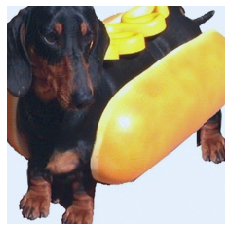

Fooling AlexNet into thinking this is a: snail
(1/100), 0.008219564915634692 confidence
(2/100), 0.0105375045677647 confidence
(3/100), 0.016708418843336403 confidence
(4/100), 0.030143148615024984 confidence
(5/100), 0.060020264936611056 confidence
(6/100), 0.11891606263816357 confidence
(7/100), 0.2534429309889674 confidence
(8/100), 0.5404649302363396 confidence
(9/100), 1.1278865858912468 confidence
(10/100), 2.2255437448620796 confidence
(11/100), 3.8165338337421417 confidence
(12/100), 6.085970997810364 confidence
(13/100), 10.588247328996658 confidence
(14/100), 18.648609519004822 confidence
(15/100), 29.358741641044617 confidence
(16/100), 44.04255449771881 confidence
(17/100), 59.51765179634094 confidence
(18/100), 74.86141920089722 confidence
(19/100), 86.16512417793274 confidence
(20/100), 93.00125241279602 confidence


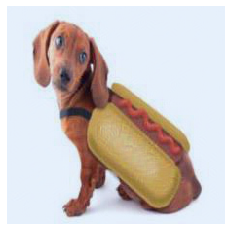

Fooling AlexNet into thinking this is a: snail
(1/100), 0.0019911678464268334 confidence
(2/100), 0.0024079035938484594 confidence
(3/100), 0.0033627511584199965 confidence
(4/100), 0.005236172728473321 confidence
(5/100), 0.008656365389470011 confidence
(6/100), 0.015049085777718574 confidence
(7/100), 0.027614610735327005 confidence
(8/100), 0.05508858012035489 confidence
(9/100), 0.11794043239206076 confidence
(10/100), 0.26447337586432695 confidence
(11/100), 0.5800141952931881 confidence
(12/100), 1.2613951228559017 confidence
(13/100), 2.4832291528582573 confidence
(14/100), 4.625355824828148 confidence
(15/100), 8.193791657686234 confidence
(16/100), 13.747681677341461 confidence
(17/100), 23.00408184528351 confidence
(18/100), 36.19276285171509 confidence
(19/100), 51.033759117126465 confidence
(20/100), 65.10390043258667 confidence
(21/100), 76.71099305152893 confidence
(22/100), 85.11134386062622 confidence
(23/100), 90.8693015575409 confidence


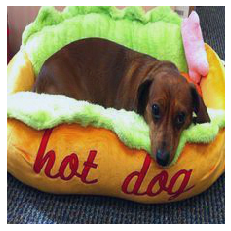


Left: original, middle: fooling image, right: difference magnified by 5x (gray is 0).
AlexNet will classify the middle image in each row as 'snail' with high confidence


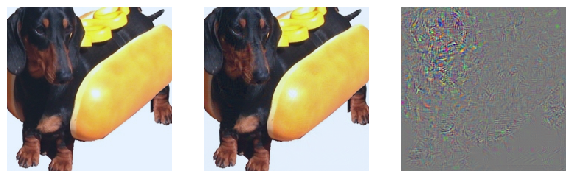

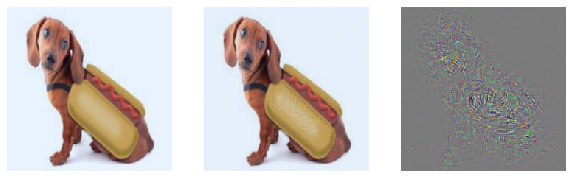

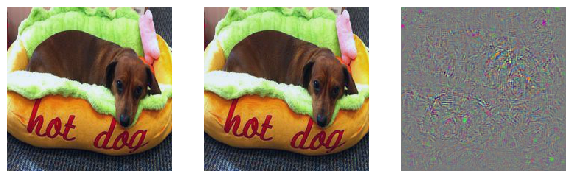

Fooling AlexNet into thinking this is a: snail
(1/100), 0.0043887434003409 confidence
(2/100), 0.0061291109886951745 confidence
(3/100), 0.011885502317454666 confidence
(4/100), 0.029693543910980225 confidence
(5/100), 0.0917708093766123 confidence
(6/100), 0.3107380121946335 confidence
(7/100), 1.018222887068987 confidence
(8/100), 2.969784289598465 confidence
(9/100), 7.087267190217972 confidence
(10/100), 14.38560038805008 confidence
(11/100), 25.817638635635376 confidence
(12/100), 41.83038771152496 confidence
(13/100), 58.51561427116394 confidence
(14/100), 70.50057053565979 confidence
(15/100), 77.9343843460083 confidence
(16/100), 83.4010362625122 confidence
(17/100), 87.47907280921936 confidence
(18/100), 90.3743326663971 confidence


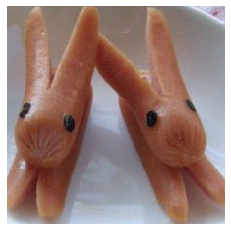

Fooling AlexNet into thinking this is a: snail
(1/100), 0.00015896717968644225 confidence
(2/100), 0.0001771420102159027 confidence
(3/100), 0.00021643404579663184 confidence
(4/100), 0.0002888558583435952 confidence
(5/100), 0.00041665020944492426 confidence
(6/100), 0.0006244150426937267 confidence
(7/100), 0.0009627478902984876 confidence
(8/100), 0.0016320545910275541 confidence
(9/100), 0.00285798596451059 confidence
(10/100), 0.00524446768395137 confidence
(11/100), 0.009463157039135695 confidence
(12/100), 0.01630146289244294 confidence
(13/100), 0.027610998949967325 confidence
(14/100), 0.04809393431060016 confidence
(15/100), 0.08562167058698833 confidence
(16/100), 0.15328996814787388 confidence
(17/100), 0.28024434577673674 confidence
(18/100), 0.4877218510955572 confidence
(19/100), 0.8155256509780884 confidence
(20/100), 1.384374313056469 confidence
(21/100), 2.402615174651146 confidence
(22/100), 3.980472683906555 confidence
(23/100), 6.389756500720978 confidence
(24/100)

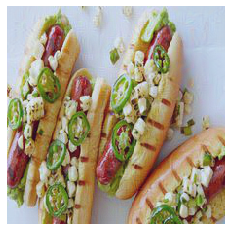

Fooling AlexNet into thinking this is a: snail
(1/100), 0.6804067175835371 confidence
(2/100), 0.7812971249222755 confidence
(3/100), 0.9945999830961227 confidence
(4/100), 1.3848521746695042 confidence
(5/100), 2.064385451376438 confidence
(6/100), 3.2224170863628387 confidence
(7/100), 5.136233568191528 confidence
(8/100), 8.111269026994705 confidence
(9/100), 12.684667110443115 confidence
(10/100), 18.882933259010315 confidence
(11/100), 26.843959093093872 confidence
(12/100), 35.6904536485672 confidence
(13/100), 44.93294656276703 confidence
(14/100), 54.05502915382385 confidence
(15/100), 63.278430700302124 confidence
(16/100), 72.12479710578918 confidence
(17/100), 79.49026226997375 confidence
(18/100), 84.84576940536499 confidence
(19/100), 88.52177858352661 confidence
(20/100), 91.09775424003601 confidence


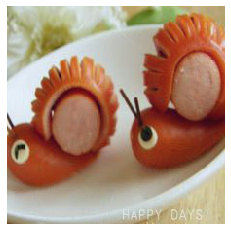


Left: original, middle: fooling image, right: difference magnified by 5x (gray is 0).
AlexNet will classify the middle image in each row as 'snail' with high confidence


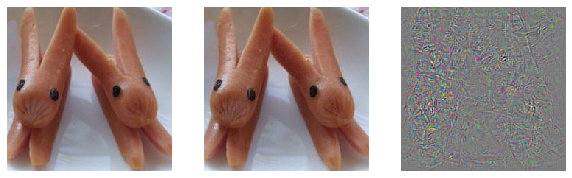

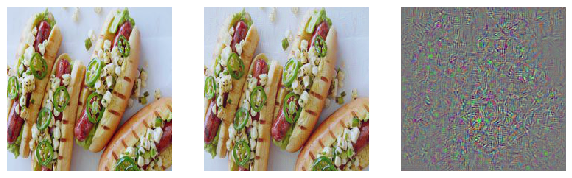

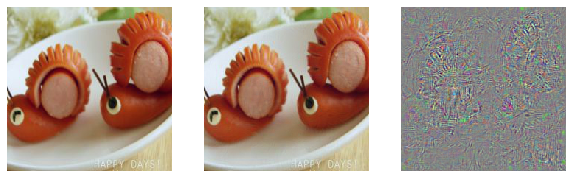

In [63]:
model = alexnet(pretrained=True)

# Set the model to eval mode
model.eval()

def make_fooling_image(image, target_class, learning_rate, regularization,
                       num_iter, momentum, threshold=0.9):
    """
    Fool AlexNet into thinking that any image has a particular class, by perturbing it just a little bit
    
    :param image: starting image CxHxW tensor
    :param target_class: the class that this will become after optimization
    :param learning_rate: either a constant, or a function that returns the learning rate at each iteration
    :param regularization: lambda parameter to multiply the regularizer
    :param num_iter: maximum number of iterations
    :param momentum: amount of momentum to use in the SGD 
    :param threshold: the target score for target_class
    """
    # Create batch dimension and turn into a variable
    image = image[np.newaxis, ...]
    
    print(f"Fooling AlexNet into thinking this is a: {labels_id2word[target_class]}")
    
    # This is the original image (used by the regularizer)
    orig_data = Variable(image.clone())
    
    image_in = Variable(image, requires_grad=True)
    velocity = torch.zeros_like(image_in)
        
    for i in range(num_iter):
        curr_scores = model(image_in)[0]
        curr_probs = F.softmax(curr_scores, 0)
        
        target_prob = curr_probs[target_class]
        target_score = curr_scores[target_class]
                
        # compute the gradient
        grad_wrt_image = fooling_image_gradient(
            target_score, orig_data, image_in, target_class, regularization)
        
        # update the image with the SGD rule
        image_in, velocity = normalized_sgd_with_momentum_update(
            image_in, grad_wrt_image, velocity, momentum, learning_rate)
        
        # Detach the image and velocity so that we don't backprop through
        # multiple iterations of the loop
        image_in = Variable(image_in.data, requires_grad = True)
        velocity = Variable(velocity.data, requires_grad = False)
        
        # Zero the gradients
        model.zero_grad()
        
        # Take the target probability out of the variable (turn it into float)
        target_prob = target_prob.data.item()
        
        # visualize the current state
        print(f"({i+1}/{num_iter}), {target_prob * 100} confidence")
        
        if target_prob > threshold:
            break
    
    delta = (image_in - orig_data).data
    return image_in, delta


num_images = 2
target_class=113
for cidx, cname in enumerate(classes):
    dataset = class_datasets[cidx]
    
    images_in = []
    fooling_images = []
    deltas = []
    
    for i, input in enumerate(dataset):
      image_in = input[0]
      label = input[1]
      
      fooling_image, delta = make_fooling_image(
          image_in,
          target_class=target_class,
          learning_rate=1e-1,
          regularization=5e-5,
          num_iter=100,
          momentum=0.9)
      
      delta = 0.5 + (5.0/255.0) * delta
    
      images_in.append(image_in)

      show_image(fooling_image)
    
      fooling_images.append(fooling_image)
      deltas.append(delta)
    
      if i >= num_images:
        break
        
    print ("\nLeft: original, middle: fooling image, right: difference magnified by 5x (gray is 0).\n"
        "AlexNet will classify the middle image in each row as %r with high confidence" % (
        labels_id2word[target_class]))
    
    show_image_rows(list(zip(images_in, fooling_images, deltas)))

# 6. 类的可视化

我们可以从随机噪声开始并最大化某个类别的概率来将AlexNet内存储的某个类的知识可视化[3]。这与制作“欺骗”图像的想法相似，不同之处在于正则化项有所不同。

同样，我们可以将其写为损失函数$L$：$$
L = -s_y(I) + R(I)
$$

其中$$
R(I) = 0.5 \lambda \|I\|_2^2
$$$y$是目标类，$\lambda$是正则化系数，$I$为输入网络的图像，也就是最终构造出的类知识图像。

[[3] Yosinski et al, "Understanding Neural Networks Through Deep Visualization", ICML 2015 Deep Learning Workshop](https://arxiv.org/pdf/1506.06579.pdf)，见paper目录下的Deep Visualization.pdf文件。

### **<font color="red">TODO 6:实现`class_visualization_gradient`函数：计算梯度$({\partial L \over \partial I})$，将其写于上面“所有TODO的解答”Cell中**
提示：你会发现`torch.norm()`函数很有用。

In [64]:
model = alexnet(pretrained=True)

# Set the model to eval mode
model.eval()

def make_class_visualization(target_class, learning_rate, regularization, num_iter,
                             max_jitter, blur_sigma, momentum):
    """
    Visualize an ILSVRC2012 class by maximizing the probability of that class, starting from random.
    
    :param target_class: what ILSVRC2012 class to visualize
    :param learning_rate: either a constant, or a function that returns the learning rate at each iteration
    :param regularization: lambda parameter to multiply the regularizer
    :param num_iter: number of iterations
    :param max_jitter: amount of jitter to add for regularization
    :param blur_sigma: blur each iteration by this amount.
    :param momentum: amount of momentum to use in the SGD update
    """
    
    image_np = 100 * np.random.randn(1, 3, 224, 224).astype(np.float32)
    vel_np = np.zeros_like(image_np)
    
    print(f"Generating visualization of: {labels_id2word[target_class]}...")
    
    for i in range(num_iter):
        # Random jitter to regularize
        ox, oy = np.random.randint(-max_jitter, max_jitter+1, 2)
        
        image_np = np.roll(np.roll(image_np, ox, -1), oy, -2)
        vel_np = np.roll(np.roll(vel_np, ox, -1), oy, -2)
        
        image = Variable(torch.from_numpy(image_np), requires_grad=True)
        velocity = Variable(torch.from_numpy(vel_np), requires_grad=False)
        
        # Compute the current class score
        class_scores = model(image)[0]
        class_probs = F.softmax(class_scores, 0)
        
        target_score = class_scores[target_class]
        target_prob = class_probs[target_class]
                
        # Compute the gradient
        grad = class_visualization_gradient(
            target_score, image, target_class, regularization)
        
        # Normalized SGD+Momentum update
        image, velocity = normalized_sgd_with_momentum_update(
            image, grad, velocity, momentum, learning_rate)
        
        # Convert back to numpy
        image_np = image.data.cpu().numpy()
        vel_np = velocity.data.cpu().numpy()
        
        # Undo jitter
        image_np = np.roll(np.roll(image_np, -ox, -1), -oy, -2)
        vel_np = np.roll(np.roll(vel_np, -ox, -1), -oy, -2)
        
        # blur the image every iteration
        for c in range(3):
            image_np[0, c, ...] = gaussian_filter(image_np[0, c, ...], sigma=blur_sigma)
        
        # Convert to float
        target_prob = target_prob.data.item()
        target_score = target_score.data.item()
        
        # Visualize our current result
        print(f"({i+1}/{num_iter}), {target_prob * 100} % confidence, score: {target_score}")
    
    return torch.from_numpy(image_np)[0]

Loading pre-trained weights from model zoo


## 生成图像!
使用make_class_visualization可视化示例Flamingo或Tarantula。你可以调增超参数，或生成新的类，但是你必须至少生成Flamingo或Tarantula。

类的列表位于dataset目录下的imagenet_classes.txt文件中。

Generating visualization of: flamingo...
(1/250), 0.0 % confidence, score: 68.42720794677734
(2/250), 0.0 % confidence, score: 77.31303405761719
(3/250), 0.0 % confidence, score: 75.76592254638672
(4/250), 0.0 % confidence, score: 112.28543853759766
(5/250), 0.0 % confidence, score: 102.53236389160156
(6/250), 0.0 % confidence, score: 111.22029876708984
(7/250), 0.0 % confidence, score: 101.92432403564453
(8/250), 0.0 % confidence, score: 141.99281311035156
(9/250), 0.0 % confidence, score: 120.64820098876953
(10/250), 0.0 % confidence, score: 120.5317153930664
(11/250), 0.0 % confidence, score: 160.01400756835938
(12/250), 0.0 % confidence, score: 146.5609130859375
(13/250), 0.0 % confidence, score: 186.60826110839844
(14/250), 0.0 % confidence, score: 189.42832946777344
(15/250), 0.0 % confidence, score: 202.04652404785156
(16/250), 6.469263996142415e-34 % confidence, score: 286.17919921875
(17/250), 2.2420775429197073e-42 % confidence, score: 287.88067626953125
(18/250), 5.904131231

(151/250), 100.0 % confidence, score: 16760.087890625
(152/250), 100.0 % confidence, score: 17320.92578125
(153/250), 100.0 % confidence, score: 19154.841796875
(154/250), 100.0 % confidence, score: 18710.5078125
(155/250), 100.0 % confidence, score: 17827.46875
(156/250), 100.0 % confidence, score: 18182.26953125
(157/250), 100.0 % confidence, score: 17621.58984375
(158/250), 100.0 % confidence, score: 18300.142578125
(159/250), 100.0 % confidence, score: 18372.4765625
(160/250), 100.0 % confidence, score: 18825.26171875
(161/250), 100.0 % confidence, score: 18798.26953125
(162/250), 100.0 % confidence, score: 20878.83203125
(163/250), 100.0 % confidence, score: 18119.2734375
(164/250), 100.0 % confidence, score: 19326.6640625
(165/250), 100.0 % confidence, score: 17323.7265625
(166/250), 100.0 % confidence, score: 17945.6015625
(167/250), 100.0 % confidence, score: 18873.37109375
(168/250), 100.0 % confidence, score: 19130.556640625
(169/250), 100.0 % confidence, score: 20787.9667968

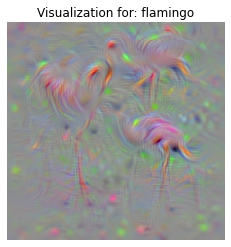

In [65]:
target_class = 130 # flamingo
image = make_class_visualization(
    target_class=target_class,
    learning_rate=200,
    regularization=1e-7,
    num_iter=250,
    max_jitter=5,
    blur_sigma=0.4,
    momentum=0.9,
)

show_image(image, f"Visualization for: {labels_id2word[target_class]}")

Generating visualization of: tarantula...
(1/250), 0.0 % confidence, score: -23.93157196044922
(2/250), 0.0 % confidence, score: -11.882547378540039
(3/250), 0.0 % confidence, score: -18.06488609313965
(4/250), 0.0 % confidence, score: -23.324710845947266
(5/250), 0.0 % confidence, score: -4.781644821166992
(6/250), 0.0 % confidence, score: 3.8665695190429688
(7/250), 0.0 % confidence, score: 18.977678298950195
(8/250), 0.0 % confidence, score: 15.728787422180176
(9/250), 0.0 % confidence, score: 19.855722427368164
(10/250), 0.0 % confidence, score: 50.60844421386719
(11/250), 0.0 % confidence, score: 83.52175903320312
(12/250), 0.0 % confidence, score: 49.901615142822266
(13/250), 4.203895392974451e-43 % confidence, score: 92.67222595214844
(14/250), 0.0 % confidence, score: 63.30839538574219
(15/250), 1.401298464324817e-43 % confidence, score: 78.66182708740234
(16/250), 0.0 % confidence, score: 79.63002014160156
(17/250), 7.607020460068643e-36 % confidence, score: 119.3712158203125


(153/250), 0.0 % confidence, score: 5360.759765625
(154/250), 0.0 % confidence, score: 6242.48876953125
(155/250), 8.488474748927797e-37 % confidence, score: 6576.1171875
(156/250), 1.2879289161105008e-30 % confidence, score: 6104.10986328125
(157/250), 0.0 % confidence, score: 6394.24755859375
(158/250), 0.0 % confidence, score: 4977.9951171875
(159/250), 6.362766772508621 % confidence, score: 6740.89892578125
(160/250), 100.0 % confidence, score: 6983.65478515625
(161/250), 100.0 % confidence, score: 6552.74658203125
(162/250), 100.0 % confidence, score: 5782.04541015625
(163/250), 99.9186098575592 % confidence, score: 5974.44287109375
(164/250), 0.0 % confidence, score: 6843.17333984375
(165/250), 100.0 % confidence, score: 6810.5302734375
(166/250), 5.128591348976582e-27 % confidence, score: 5763.25244140625
(167/250), 0.0 % confidence, score: 5941.8671875
(168/250), 6.212753248081188e-18 % confidence, score: 7131.00830078125
(169/250), 100.0 % confidence, score: 7162.560546875
(17

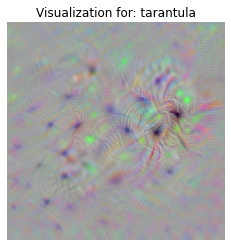

In [66]:
target_class = 76 # tarantula
image = make_class_visualization(
    target_class=target_class,
    learning_rate=200,
    regularization=1e-7,
    num_iter=250,
    max_jitter=5,
    blur_sigma=0.4,
    momentum=0.9,
)

show_image(image, f"Visualization for: {labels_id2word[target_class]}")

In [ ]:
# Try other classes here

# Test cases

## 运行以下程序块来测试你的TODO实现

### Helper functions

In [48]:
import io


def _load(fname):
    """ Helper to load compressed .npz arrays """
    return np.load(os.getcwd()+'/'+fname)['arr_0']

def relative_error(expected, actual, epsilon=1e-5):
    """ Mean relative error between two arrays """
    return np.mean(
        np.abs(expected - actual) /
        np.maximum(np.abs(actual), epsilon)
    )


### Test `compute_dscore_dimage`

In [49]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_compute_dscore_dimage():
    image = _load("expected/data.npz")
    expected =  _load("expected/compute_dscore_dimage-grad.npz")
    image = torch.from_numpy(image).unsqueeze(0)    
    image_in = Variable(image, requires_grad=True)
    cls_scores = net(image_in)[0]
    actual_grad = compute_dscore_dimage(cls_scores, image_in, 254)

    # relative error must be small
    assert relative_error(expected, actual_grad.data.numpy()) < THRESH
    print("Passed!")
test_compute_dscore_dimage()

Loading pre-trained weights from model zoo
Passed!


### Test `normalized_sgd_with_momentum_update`

In [50]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_normalized_sgd_with_momentum_update():
    image = _load("expected/data.npz")
    grad = _load('expected/normalized_sgd_with_momentum_update-grad.npz')
    velocity = _load('expected/normalized_sgd_with_momentum_update-velocity.npz')
    expected_data = _load('expected/normalized_sgd_with_momentum_update-new_data.npz')
    expected_velocity = _load('expected/normalized_sgd_with_momentum_update-new_velocity.npz')
    
    image = torch.from_numpy(image).unsqueeze(0)
    image = Variable(image, requires_grad=True)

    grad = torch.from_numpy(grad)
    grad = Variable(grad, requires_grad=True)

    velocity = torch.from_numpy(velocity)
    velocity = Variable(velocity, requires_grad=True)

    
    
    momentum = 0.99
    learning_rate = 100

    new_data, new_velocity = normalized_sgd_with_momentum_update(
        image, grad, velocity, momentum, learning_rate)

    # relative error must be small
    assert relative_error(expected_data, new_data.data.numpy()) < THRESH
    assert relative_error(expected_velocity, new_velocity.data.numpy()) < THRESH
    print("Passed!")
test_normalized_sgd_with_momentum_update()

Loading pre-trained weights from model zoo
Passed!


### Test `fooling_image_gradient`

In [60]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_fooling_image_gradient():
    image = torch.from_numpy(_load("expected/data.npz")).unsqueeze(0)
    image = Variable(image, requires_grad=True)

    new_image = torch.from_numpy(\
            _load("expected/normalized_sgd_with_momentum_update-new_data.npz"))

    new_image = Variable(new_image, requires_grad=True)
    
    net.zero_grad()
    
    target_class=113
    curr_scores = net(new_image)[0]
    target_score = curr_scores[113]
    regularization = 1e-3
    target_grad = fooling_image_gradient(target_score, image, new_image, target_class, regularization)
    expected = _load('expected/fooling_image_gradient-grad.npz')
    assert relative_error(expected, target_grad.data.numpy()) < THRESH
    print("Passed!")
    
test_fooling_image_gradient()

Loading pre-trained weights from model zoo
Passed!


### Test `test_class_visualization_gradient`

In [62]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_class_visualization_gradient():
    image = torch.from_numpy(_load("expected/class_visualization_gradient-cur_data.npz")).unsqueeze(0)
    image = Variable(image, requires_grad=True)
    
    target_class = 130
    
    net.zero_grad()
    
    class_scores = net(image)[0]
    target_score = class_scores[target_class]
    regularization = 1e-3

    grad = class_visualization_gradient(target_score, image, target_class, regularization)
    
    expected = _load('expected/class_visualization_gradient-grad.npz')
    assert relative_error(expected, grad.data.numpy()) < THRESH
    print("Passed!")
test_class_visualization_gradient()

Loading pre-trained weights from model zoo
Passed!
